# Underwater Image Semantic Segmentation using U-Net with VGG16 Backbone

This notebook implements an underwater image semantic segmentation model using a U-Net architecture with a pre-trained VGG16 backbone in TensorFlow/Keras.

**Key Features:**
- **U-Net Architecture:** Suitable for precise image segmentation.
- **VGG16 Backbone:** Leverages pre-trained weights from ImageNet for feature extraction.
- **RGB Image Input:** Works with standard 3-channel color images.
- **Multi-Class Segmentation:** Designed for 8 distinct underwater classes.
- **Data Handling:** Includes functions to load images and RGB-coded masks, converting masks to integer format for training.
- **Directory Structure:** Expects `train` and `test` folders, each with `images` and `masks` subfolders.

## 1. Imports and Setup

In [3]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import VGG16
import matplotlib.pyplot as plt # For optional visualization
#from tensorflow.keras.callbacks import ReduceLROnPlateau #for adaptive learning rate
#from tensorflow.keras.callbacks import EarlyStopping #earlystopping

## 1.5 loading data from drive


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This command unzips dataset from Drive into a new '/content/dataset/' folder in Colab
!unzip /content/drive/MyDrive/underwater_dataset.zip -d /content/dataset/
print("Dataset unzipped.")

Dataset unzipped.


## 2. Configuration

In [6]:
# --- Image and Class Configuration ---
IMG_WIDTH = 256  # Width of the input images
IMG_HEIGHT = 256 # Height of the input images
IMG_CHANNELS = 3 # Number of image channels (RGB)
NUM_CLASSES = 8  # Total number of segmentation classes

# --- Mask Color Mapping ---
# This dictionary maps the RGB color values of your masks to integer labels.
# Ensure these RGB tuples match exactly with the colors in your mask images.
COLOR_MAP = {
    (0, 0, 0): 0,       # Background (waterbody)
    (0, 0, 255): 1,     # Human divers (Blue)
    (0, 255, 0): 2,     # Aquatic plants and sea-grass (Green)
    (0, 255, 255): 3,   # Wrecks or ruins (Cyan)
    (255, 0, 0): 4,     # Robots (AUVs/ROVs/instruments) (Red)
    (255, 0, 255): 5,   # Reefs and invertebrates (Magenta)
    (255, 255, 0): 6,   # Fish and vertebrates (Yellow)
    (255, 255, 255): 7  # Sea-floor and rocks (White)
}

# --- Training Configuration ---
BATCH_SIZE = 4 # Adjust based on your GPU memory
EPOCHS = 30    # Number of training epochs (increase for real training)
LEARNING_RATE = 1e-4

## 3. Data Loading and Preprocessing Functions

In [7]:
def rgb_to_mask(rgb_mask_array, color_map):
    """
    Converts an RGB mask image (numpy array) to a 2D integer mask.
    Each pixel in the output mask will have an integer value corresponding to its class.
    """
    mask = np.zeros((rgb_mask_array.shape[0], rgb_mask_array.shape[1]), dtype=np.uint8)
    for rgb_tuple, class_label in color_map.items():
        # Find all pixels where the R, G, and B channels match the current color
        matches = np.all(rgb_mask_array == np.array(rgb_tuple).reshape(1, 1, 3), axis=-1)
        mask[matches] = class_label
    return mask

def load_image_and_mask(image_path, mask_path):
    """
    Loads an image and its corresponding mask, preprocesses them,
    and converts the mask to integer format.
    """
    # Load image
    image = img_to_array(load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH)))
    image = image / 255.0  # Normalize image to [0, 1]

    # Load RGB mask
    mask_rgb_array = img_to_array(load_img(mask_path, target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="rgb"))

    # Convert RGB mask to integer mask
    mask_integer = rgb_to_mask(mask_rgb_array, COLOR_MAP)
    mask_integer = tf.expand_dims(mask_integer, axis=-1) # Add channel dimension for TensorFlow

    return image, mask_integer

def create_tf_dataset(image_dir, mask_dir):
    """
    Creates a TensorFlow Dataset from directories containing images and masks.
    """
    image_filenames = sorted([os.path.join(image_dir, fname) for fname in os.listdir(image_dir)
                              if fname.lower().endswith(('.png', '.jpg', '.jpeg'))])
    mask_filenames = sorted([os.path.join(mask_dir, fname) for fname in os.listdir(mask_dir)
                             if fname.lower().endswith(('.png', '.jpg', '.jpeg' , '.bmp'))]) # Masks should ideally be PNG to preserve exact colors

    if len(image_filenames) != len(mask_filenames):
        raise ValueError(f"Mismatch in number of images and masks in {image_dir} and {mask_dir}. Images: {len(image_filenames)}, Masks: {len(mask_filenames)}")
    if not image_filenames:
        raise ValueError(f"No images found in {image_dir}")

    def generator():
        for img_path, msk_path in zip(image_filenames, mask_filenames):
            yield load_image_and_mask(img_path, msk_path)

    dataset = tf.data.Dataset.from_generator(
        generator,
        output_signature=(
            tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=tf.float32),
            tf.TensorSpec(shape=(IMG_HEIGHT, IMG_WIDTH, 1), dtype=tf.uint8) # Integer mask
        )
    )
    return dataset

## 4. U-Net Model Definition with VGG16 Backbone

In [8]:
def unet_with_vgg16_backbone(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), num_classes=NUM_CLASSES):
    """
    Builds a U-Net model using a pre-trained VGG16 as the encoder.
    """
    # Load VGG16 backbone, excluding the top classification layers
    backbone = VGG16(input_shape=input_shape, include_top=False, weights='imagenet')

    # Freeze the backbone layers to prevent them from being updated during initial training
    backbone.trainable = False # Set to True for fine-tuning later

    # --- Encoder (from VGG16) ---
    # Get the outputs of intermediate layers from VGG16 to use as skip connections
    s1 = backbone.get_layer("block1_conv2").output  # 256x256x64 (assuming input 256x256)
    s2 = backbone.get_layer("block2_conv2").output  # 128x128x128
    s3 = backbone.get_layer("block3_conv3").output  # 64x64x256
    s4 = backbone.get_layer("block4_conv3").output  # 32x32x512

    # --- Bottleneck (from VGG16) ---
    b1 = backbone.get_layer("block5_conv3").output  # 16x16x512 (after max pooling)

    # --- Decoder ---
    # Upsampling block 1
    d1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(b1) # 32x32x512
    d1 = concatenate([d1, s4]) # Skip connection
    d1 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d1)
    d1 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d1)

    # Upsampling block 2
    d2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(d1) # 64x64x256
    d2 = concatenate([d2, s3]) # Skip connection
    d2 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d2)
    d2 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d2)

    # Upsampling block 3
    d3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d2) # 128x128x128
    d3 = concatenate([d3, s2]) # Skip connection
    d3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d3)
    d3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d3)

    # Upsampling block 4
    d4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d3) # 256x256x64
    d4 = concatenate([d4, s1]) # Skip connection
    d4 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d4)
    d4 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(d4)

    # --- Output Layer ---
    # Produces a mask with 'num_classes' channels.
    # Each channel corresponds to a class, and values are probabilities (due to softmax).
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(d4)

    model = Model(inputs=backbone.input, outputs=outputs, name="U-Net_VGG16_Backbone")
    return model

## 6. Main Execution: Setup, Training, and Evaluation

### 6.1. Setup Data Paths

In [9]:
DATASET_BASE_PATH = '/content/dataset/underwater_dataset'

train_images_dir = os.path.join(DATASET_BASE_PATH, 'train', 'images')
train_masks_dir = os.path.join(DATASET_BASE_PATH, 'train', 'masks')
test_images_dir = os.path.join(DATASET_BASE_PATH, 'test', 'images')
test_masks_dir = os.path.join(DATASET_BASE_PATH, 'test', 'masks')

print(f"Using dataset from: {DATASET_BASE_PATH}")
if not os.path.exists(train_images_dir):
    print(f"WARNING: Training image directory not found at: {train_images_dir}")
else:
    print(f"Found {len(os.listdir(train_images_dir))} images in the training directory.")

Using dataset from: /content/dataset/underwater_dataset
Found 1525 images in the training directory.


### 6.2. Create TensorFlow Datasets

In [10]:
print("Creating TensorFlow datasets...")
try:
    train_dataset = create_tf_dataset(train_images_dir, train_masks_dir)
    # Add shuffle, batch, and prefetch for training dataset
    train_dataset = train_dataset.shuffle(buffer_size=100).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

    test_dataset = create_tf_dataset(test_images_dir, test_masks_dir)
    # Add batch and prefetch for test dataset
    test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    print("Datasets created successfully.")

    # Verify dataset loading by taking one sample (optional)
    for images, masks in train_dataset.take(1):
        print(f"Sample image batch shape: {images.shape}")
        print(f"Sample mask batch shape: {masks.shape}")
        print(f"Unique values in a sample mask: {np.unique(masks[0])}") # Should be integers from 0 to NUM_CLASSES-1
        break # only need one batch to check
except Exception as e:
    print(f"Error creating datasets: {e}")
    # Depending on the environment, you might want to raise e or exit

Creating TensorFlow datasets...
Datasets created successfully.
Sample image batch shape: (4, 256, 256, 3)
Sample mask batch shape: (4, 256, 256, 1)
Unique values in a sample mask: [0 1 6]


### 6.3. Build and Compile the Model

In [11]:
print("Building and compiling the model...")
model = unet_with_vgg16_backbone(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), num_classes=NUM_CLASSES)

model.compile(optimizer=Adam(learning_rate=LEARNING_RATE),
              loss=SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

Building and compiling the model...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "U-Net_VGG16_Backbone"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 256, 256,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 128, 128,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 128, 128,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 128, 128,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 64, 64,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 64, 64,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 64, 64,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 64, 64,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 32, 32,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 32, 32,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 32, 32,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 32, 32,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 16, 16,    │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 16, 16,    │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 16, 16,    │  2,359,808 │ block5_conv1[0][

 Total params: 25,855,112 (98.63 MB)

 Trainable params: 11,140,424 (42.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

### 6.3.5 Changes for callbacks

In [12]:
# --- Define the Custom Callback ---
class DisplayPredictionsCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset, num_samples=1):
        super(DisplayPredictionsCallback, self).__init__()
        # Store a single batch of data from the dataset
        for images, masks in dataset.take(1):
            self.images = images
            self.true_masks = masks
        self.num_samples = num_samples
        # Create the reverse color map once
        self.int_to_rgb_map = {v: k for k, v in COLOR_MAP.items()}

    def on_epoch_end(self, epoch, logs=None):
        # This function will be called by Keras at the end of every epoch
        print(f"\n--- Generating prediction examples for epoch {epoch + 1} ---")

        # Make predictions on the stored sample images
        # self.model is automatically set by Keras
        predicted_masks_probs = self.model.predict(self.images)
        predicted_masks_int = np.argmax(predicted_masks_probs, axis=-1)

        # Plot the samples
        for i in range(min(self.num_samples, self.images.shape[0])):
            plt.figure(figsize=(15, 5))

            # Original Image
            plt.subplot(1, 3, 1)
            plt.imshow(self.images[i])
            plt.title("Original Image")
            plt.axis('off')

            # True Mask
            true_mask_rgb = np.zeros_like(self.images[i])
            for label_int, color_rgb in self.int_to_rgb_map.items():
                true_mask_rgb[self.true_masks[i, :, :, 0] == label_int] = np.array(color_rgb) / 255.0
            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("True Mask")
            plt.axis('off')

            # Predicted Mask
            pred_mask_rgb = np.zeros_like(self.images[i])
            for label_int, color_rgb in self.int_to_rgb_map.items():
                pred_mask_rgb[predicted_masks_int[i, :, :] == label_int] = np.array(color_rgb) / 255.0
            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title(f"Predicted Mask (Epoch {epoch + 1})")
            plt.axis('off')

            plt.tight_layout()
            plt.show()

In [ ]:
# the learning rate callback
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6, verbose=1)

# the EarlyStopping callback
#early_stopper = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)


# 1. Take one batch from your test dataset to use for visualization
vis_dataset = train_dataset.take(1)

# 2. Create an instance of our new callback
display_callback = DisplayPredictionsCallback(dataset=vis_dataset, num_samples=1) # Let's display 1 samples

### 6.4. Train the Model


Starting model training...
Epoch 1/30
    382/Unknown 143s 279ms/step - accuracy: 0.5763 - loss: 1.3870

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



--- Generating prediction examples for epoch 1 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


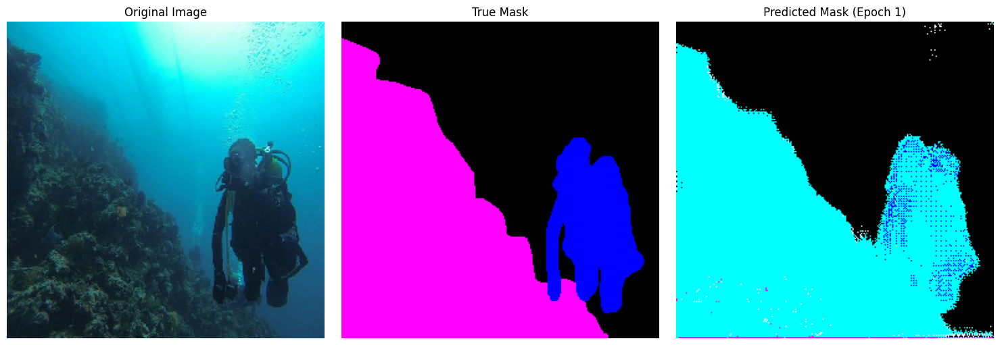

382/382 ━━━━━━━━━━━━━━━━━━━━ 162s 329ms/step - accuracy: 0.5764 - loss: 1.3863 - val_accuracy: 0.5515 - val_loss: 1.2582
Epoch 2/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.6787 - loss: 0.9787
--- Generating prediction examples for epoch 2 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


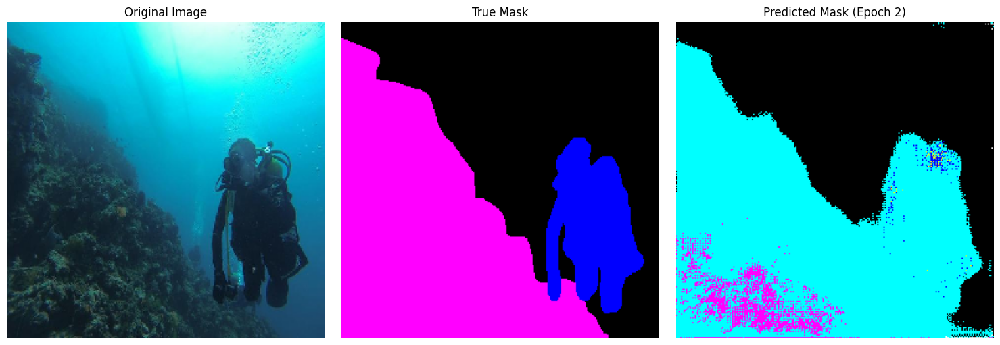

382/382 ━━━━━━━━━━━━━━━━━━━━ 188s 371ms/step - accuracy: 0.6787 - loss: 0.9786 - val_accuracy: 0.5687 - val_loss: 1.1819
Epoch 3/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.7025 - loss: 0.9097
--- Generating prediction examples for epoch 3 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


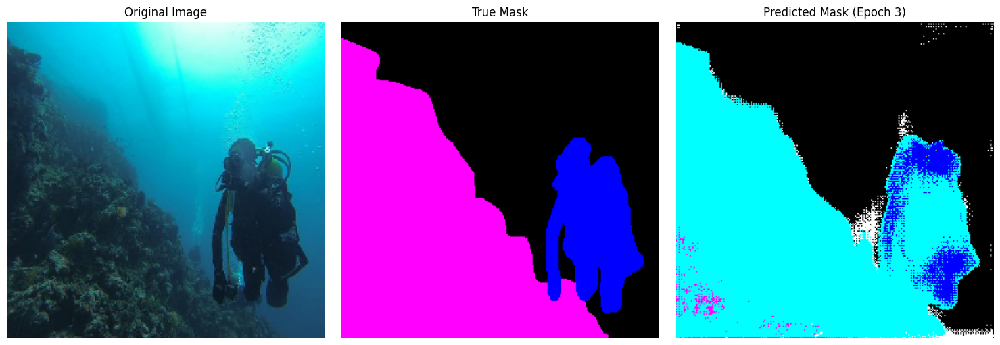

382/382 ━━━━━━━━━━━━━━━━━━━━ 202s 370ms/step - accuracy: 0.7025 - loss: 0.9096 - val_accuracy: 0.6204 - val_loss: 1.1500
Epoch 4/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.7210 - loss: 0.8695
--- Generating prediction examples for epoch 4 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


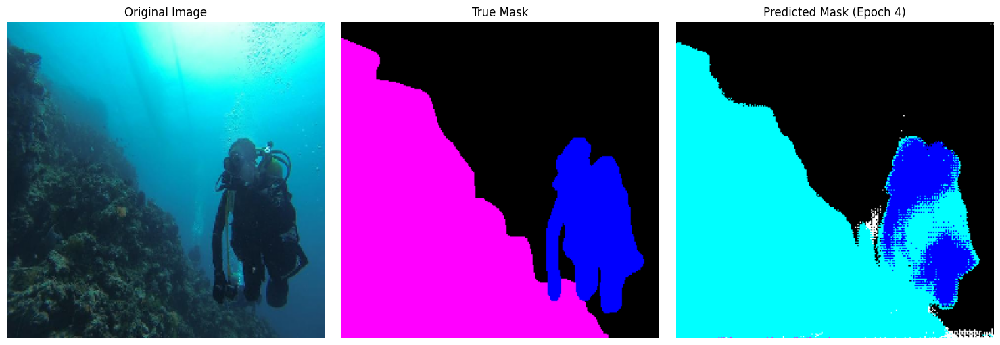

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 364ms/step - accuracy: 0.7210 - loss: 0.8694 - val_accuracy: 0.6202 - val_loss: 1.1791
Epoch 5/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.7288 - loss: 0.8411
--- Generating prediction examples for epoch 5 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


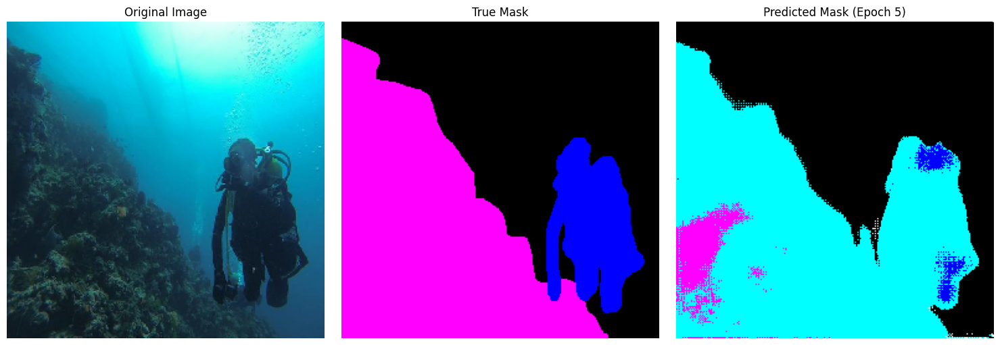

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 364ms/step - accuracy: 0.7288 - loss: 0.8409 - val_accuracy: 0.6533 - val_loss: 1.0473
Epoch 6/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7381 - loss: 0.8092
--- Generating prediction examples for epoch 6 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


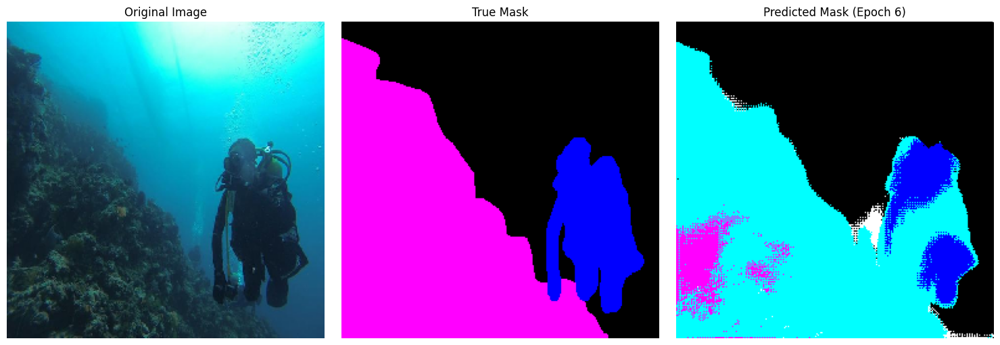

382/382 ━━━━━━━━━━━━━━━━━━━━ 163s 264ms/step - accuracy: 0.7382 - loss: 0.8090 - val_accuracy: 0.6755 - val_loss: 1.0118
Epoch 7/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.7577 - loss: 0.7555
--- Generating prediction examples for epoch 7 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


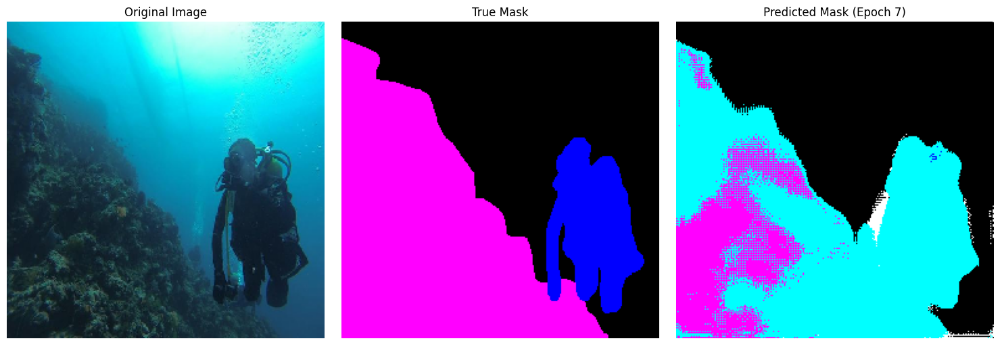

382/382 ━━━━━━━━━━━━━━━━━━━━ 104s 263ms/step - accuracy: 0.7578 - loss: 0.7554 - val_accuracy: 0.6799 - val_loss: 1.1026
Epoch 8/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.7649 - loss: 0.7309
--- Generating prediction examples for epoch 8 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


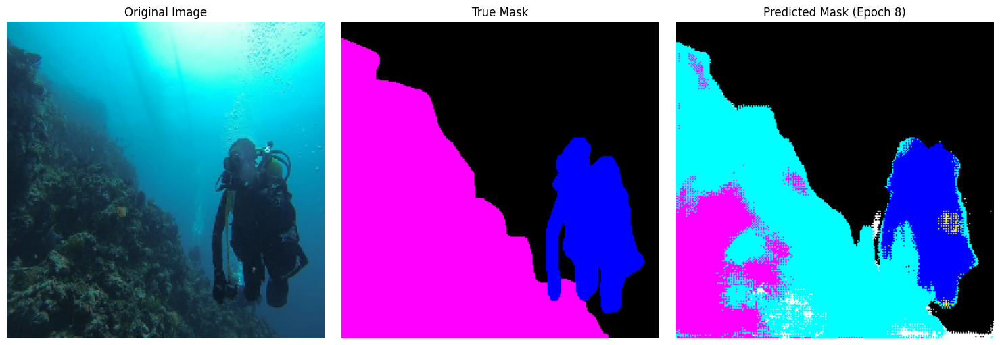

382/382 ━━━━━━━━━━━━━━━━━━━━ 105s 268ms/step - accuracy: 0.7649 - loss: 0.7308 - val_accuracy: 0.7344 - val_loss: 0.8310
Epoch 9/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.7764 - loss: 0.6894
--- Generating prediction examples for epoch 9 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


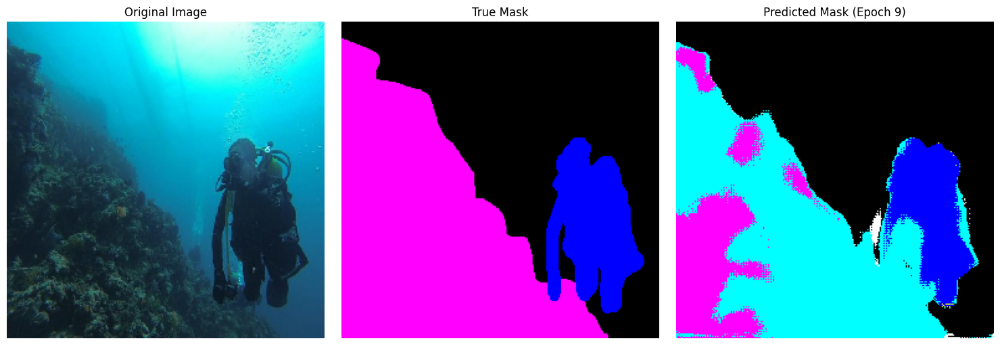

382/382 ━━━━━━━━━━━━━━━━━━━━ 202s 427ms/step - accuracy: 0.7764 - loss: 0.6893 - val_accuracy: 0.7163 - val_loss: 0.8983
Epoch 10/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.7858 - loss: 0.6668
--- Generating prediction examples for epoch 10 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


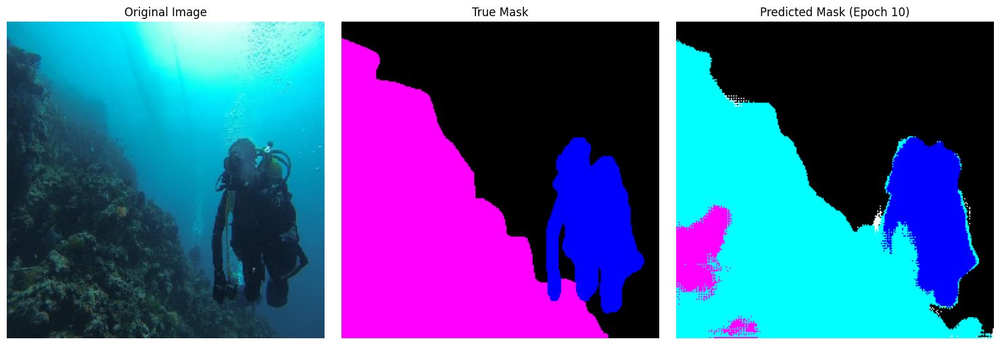

382/382 ━━━━━━━━━━━━━━━━━━━━ 107s 273ms/step - accuracy: 0.7859 - loss: 0.6667 - val_accuracy: 0.6797 - val_loss: 1.0308
Epoch 11/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.7920 - loss: 0.6474
--- Generating prediction examples for epoch 11 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


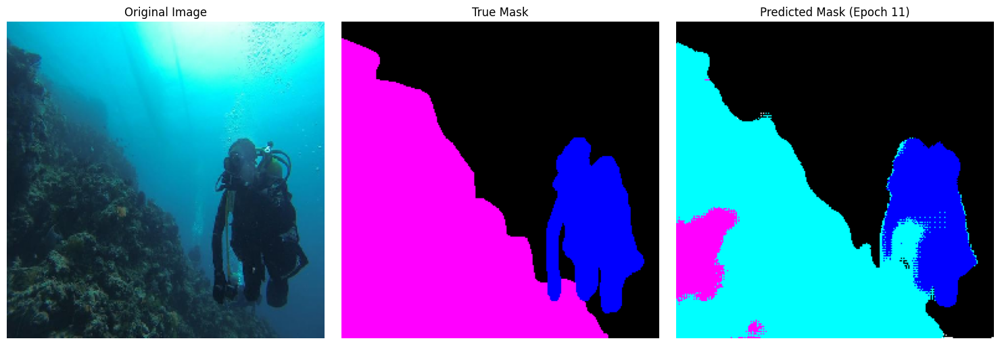

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 365ms/step - accuracy: 0.7920 - loss: 0.6472 - val_accuracy: 0.7268 - val_loss: 0.9010
Epoch 12/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.8029 - loss: 0.6112
--- Generating prediction examples for epoch 12 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


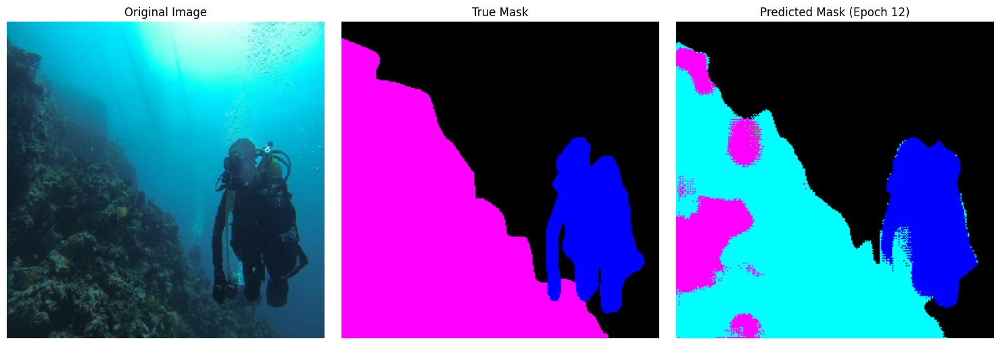

382/382 ━━━━━━━━━━━━━━━━━━━━ 108s 274ms/step - accuracy: 0.8030 - loss: 0.6111 - val_accuracy: 0.7153 - val_loss: 0.9300
Epoch 13/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.8075 - loss: 0.5870
--- Generating prediction examples for epoch 13 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


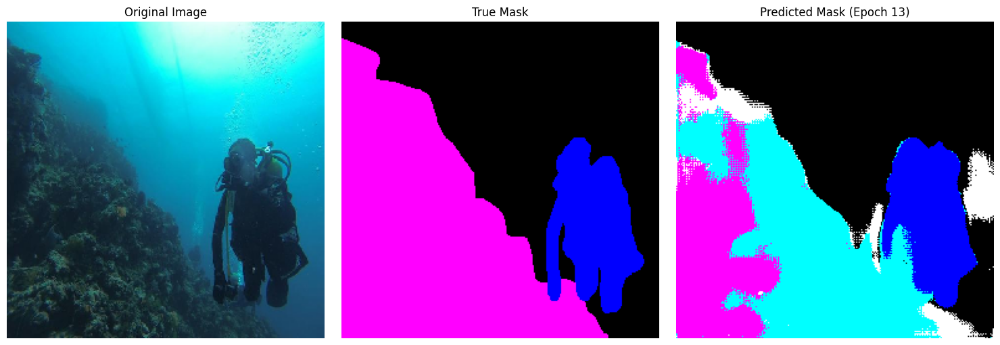

382/382 ━━━━━━━━━━━━━━━━━━━━ 202s 432ms/step - accuracy: 0.8076 - loss: 0.5869 - val_accuracy: 0.7037 - val_loss: 0.9226
Epoch 14/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.8025 - loss: 0.5911
--- Generating prediction examples for epoch 14 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


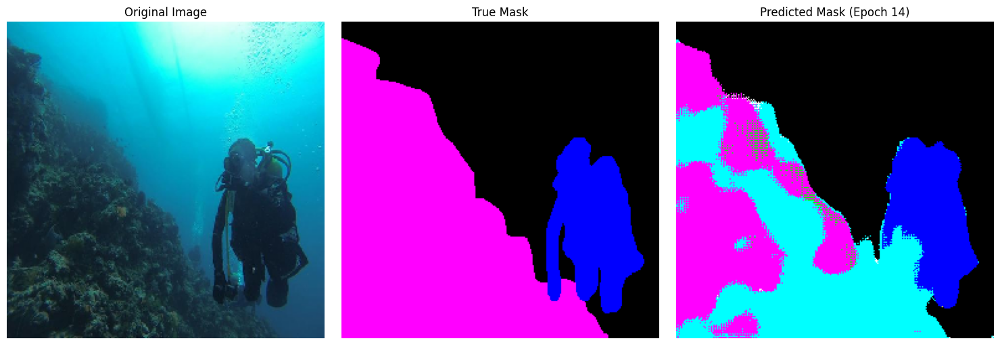

382/382 ━━━━━━━━━━━━━━━━━━━━ 109s 279ms/step - accuracy: 0.8025 - loss: 0.5909 - val_accuracy: 0.7272 - val_loss: 0.9112
Epoch 15/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.8288 - loss: 0.5243
--- Generating prediction examples for epoch 15 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


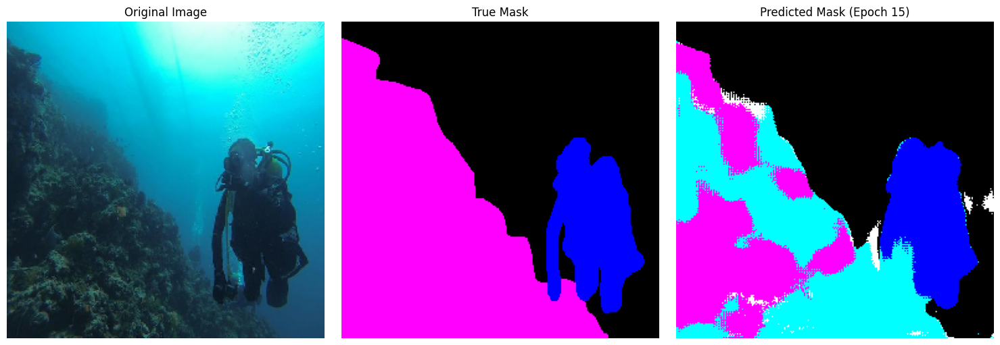

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 280ms/step - accuracy: 0.8288 - loss: 0.5242 - val_accuracy: 0.7417 - val_loss: 0.8866
Epoch 16/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.8453 - loss: 0.4731
--- Generating prediction examples for epoch 16 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


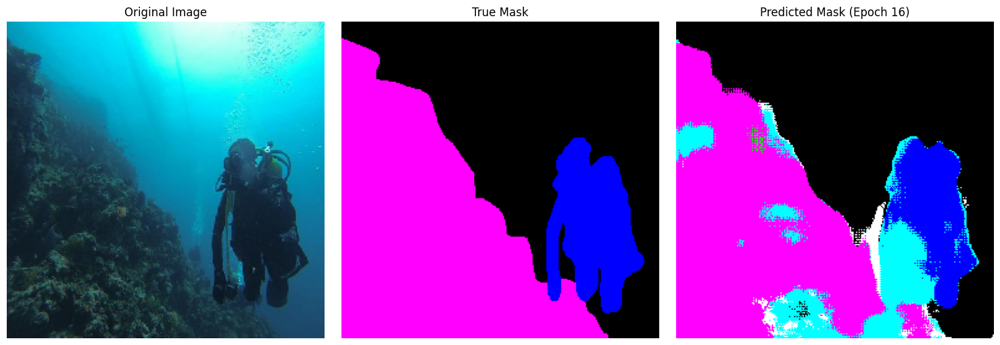

382/382 ━━━━━━━━━━━━━━━━━━━━ 110s 282ms/step - accuracy: 0.8454 - loss: 0.4730 - val_accuracy: 0.7420 - val_loss: 0.9094
Epoch 17/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.8500 - loss: 0.4570
--- Generating prediction examples for epoch 17 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


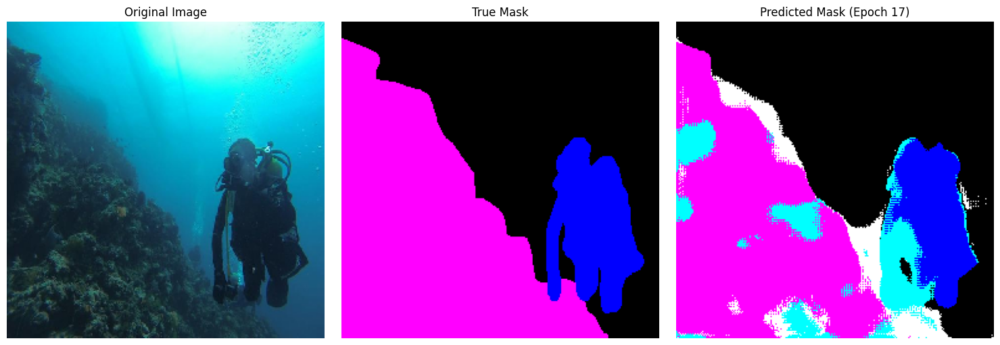

382/382 ━━━━━━━━━━━━━━━━━━━━ 143s 367ms/step - accuracy: 0.8500 - loss: 0.4569 - val_accuracy: 0.7175 - val_loss: 1.0317
Epoch 18/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8601 - loss: 0.4375
--- Generating prediction examples for epoch 18 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


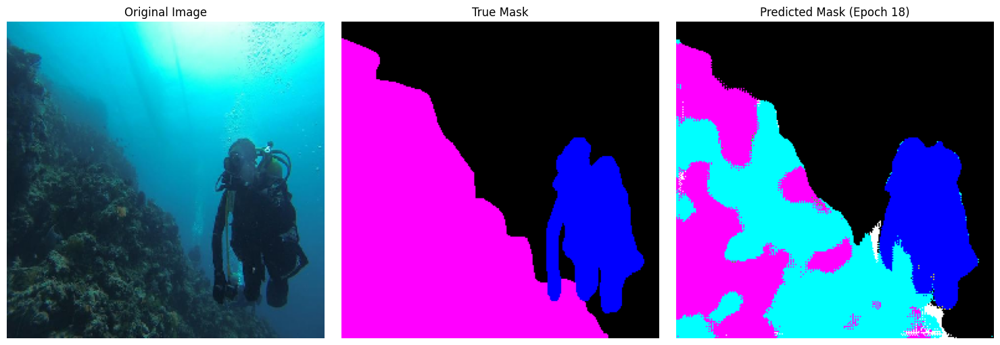

382/382 ━━━━━━━━━━━━━━━━━━━━ 141s 363ms/step - accuracy: 0.8601 - loss: 0.4374 - val_accuracy: 0.7311 - val_loss: 0.9620
Epoch 19/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8665 - loss: 0.3970
--- Generating prediction examples for epoch 19 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


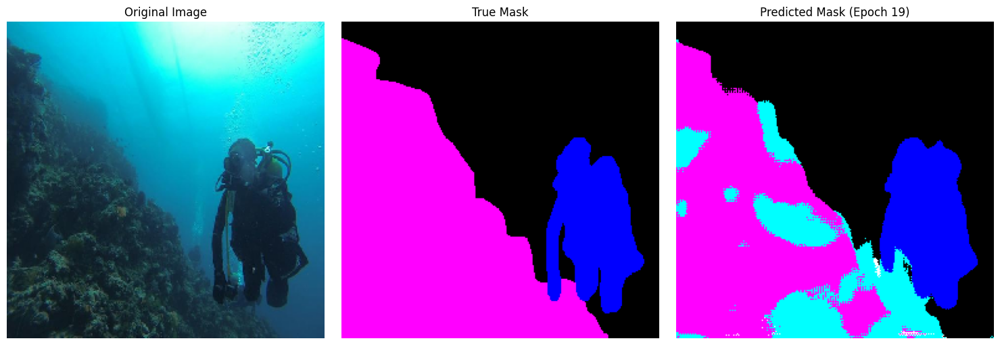

382/382 ━━━━━━━━━━━━━━━━━━━━ 113s 286ms/step - accuracy: 0.8665 - loss: 0.3969 - val_accuracy: 0.7525 - val_loss: 0.9309
Epoch 20/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8820 - loss: 0.3554
--- Generating prediction examples for epoch 20 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


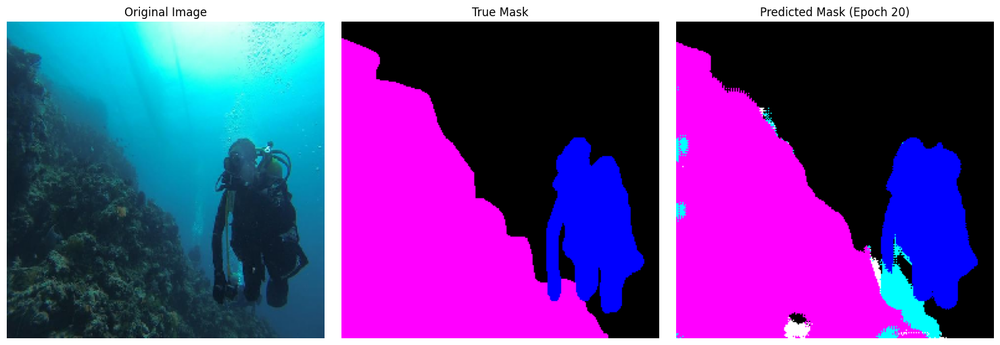

382/382 ━━━━━━━━━━━━━━━━━━━━ 112s 286ms/step - accuracy: 0.8820 - loss: 0.3554 - val_accuracy: 0.7611 - val_loss: 0.8972
Epoch 21/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.8865 - loss: 0.3455
--- Generating prediction examples for epoch 21 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


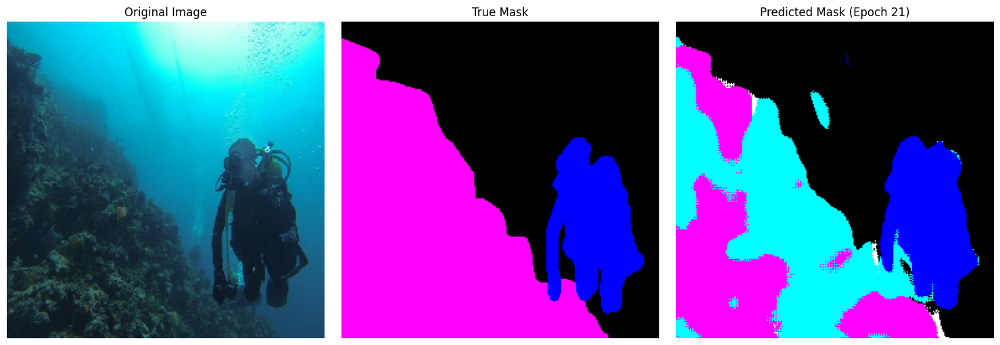

382/382 ━━━━━━━━━━━━━━━━━━━━ 141s 363ms/step - accuracy: 0.8865 - loss: 0.3455 - val_accuracy: 0.7176 - val_loss: 1.1065
Epoch 22/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.8923 - loss: 0.3270
--- Generating prediction examples for epoch 22 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


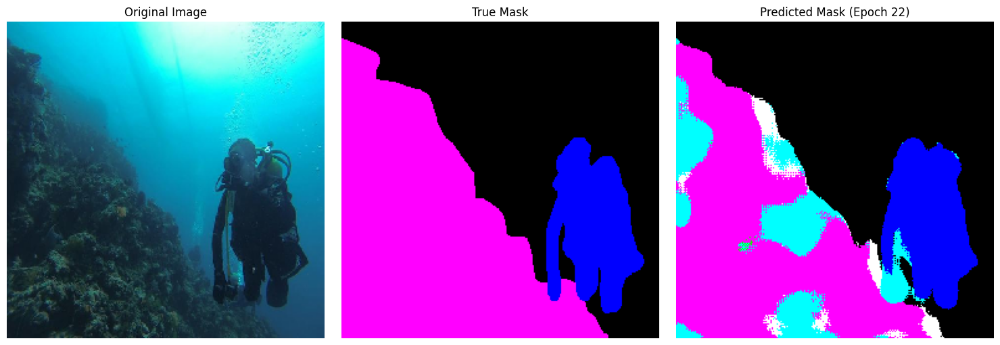

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 365ms/step - accuracy: 0.8924 - loss: 0.3270 - val_accuracy: 0.7558 - val_loss: 0.9806
Epoch 23/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9065 - loss: 0.2837
--- Generating prediction examples for epoch 23 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


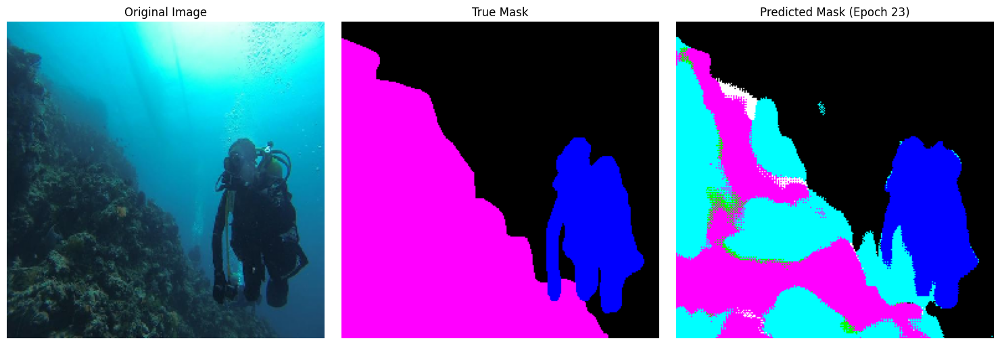

382/382 ━━━━━━━━━━━━━━━━━━━━ 141s 364ms/step - accuracy: 0.9066 - loss: 0.2836 - val_accuracy: 0.7181 - val_loss: 1.1249
Epoch 24/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9011 - loss: 0.3008
--- Generating prediction examples for epoch 24 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


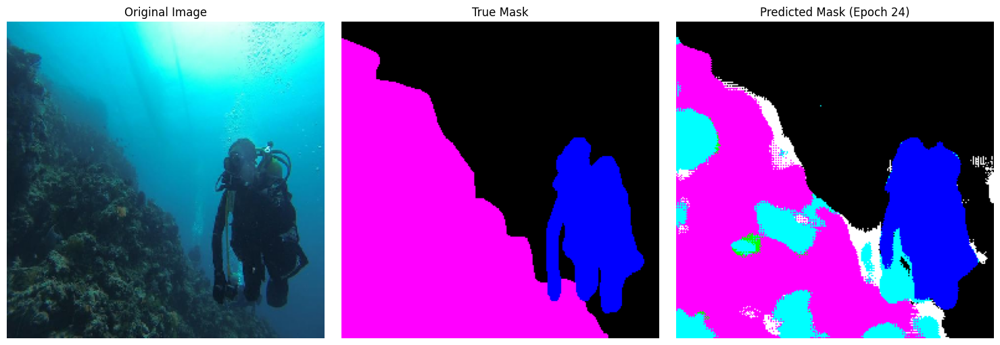

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 363ms/step - accuracy: 0.9011 - loss: 0.3007 - val_accuracy: 0.7137 - val_loss: 1.0940
Epoch 25/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9118 - loss: 0.2652
--- Generating prediction examples for epoch 25 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


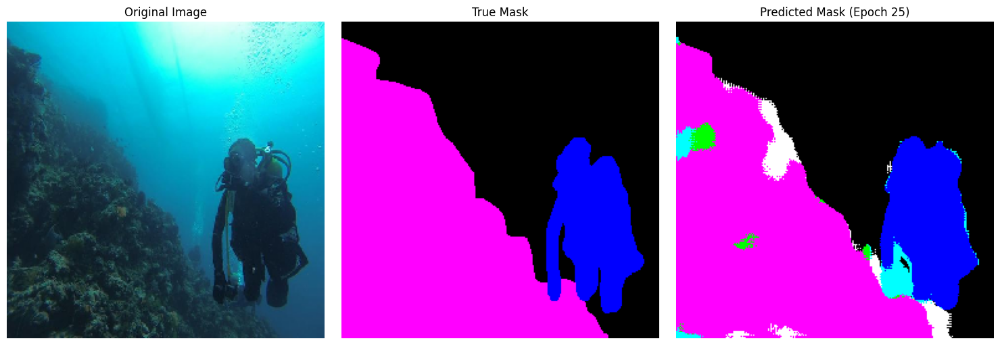

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 365ms/step - accuracy: 0.9118 - loss: 0.2651 - val_accuracy: 0.7226 - val_loss: 1.0049
Epoch 26/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9215 - loss: 0.2395
--- Generating prediction examples for epoch 26 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


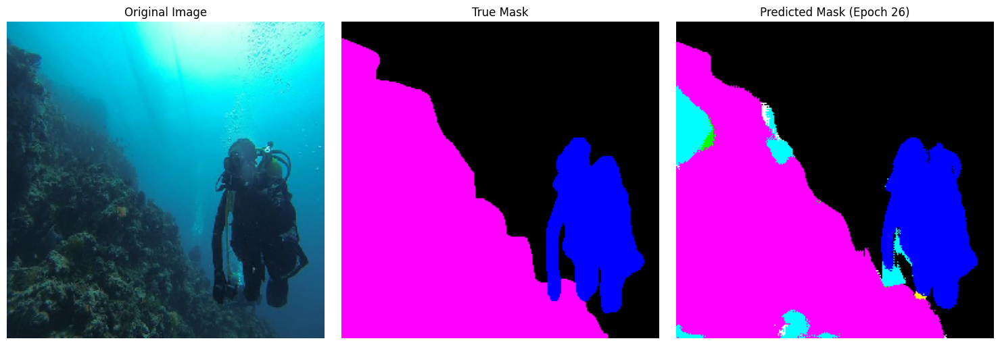

382/382 ━━━━━━━━━━━━━━━━━━━━ 113s 287ms/step - accuracy: 0.9215 - loss: 0.2395 - val_accuracy: 0.7538 - val_loss: 1.0494
Epoch 27/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9321 - loss: 0.2075
--- Generating prediction examples for epoch 27 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


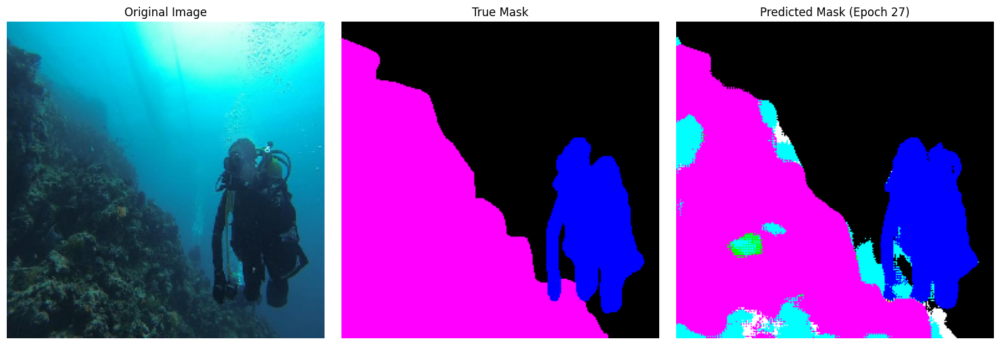

382/382 ━━━━━━━━━━━━━━━━━━━━ 140s 286ms/step - accuracy: 0.9321 - loss: 0.2074 - val_accuracy: 0.7396 - val_loss: 1.0480
Epoch 28/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9322 - loss: 0.2031
--- Generating prediction examples for epoch 28 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


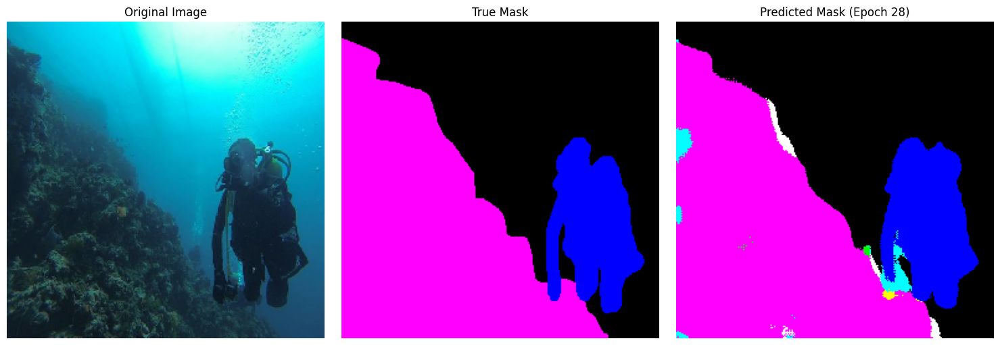

382/382 ━━━━━━━━━━━━━━━━━━━━ 202s 440ms/step - accuracy: 0.9322 - loss: 0.2030 - val_accuracy: 0.7504 - val_loss: 1.1221
Epoch 29/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9396 - loss: 0.1807
--- Generating prediction examples for epoch 29 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


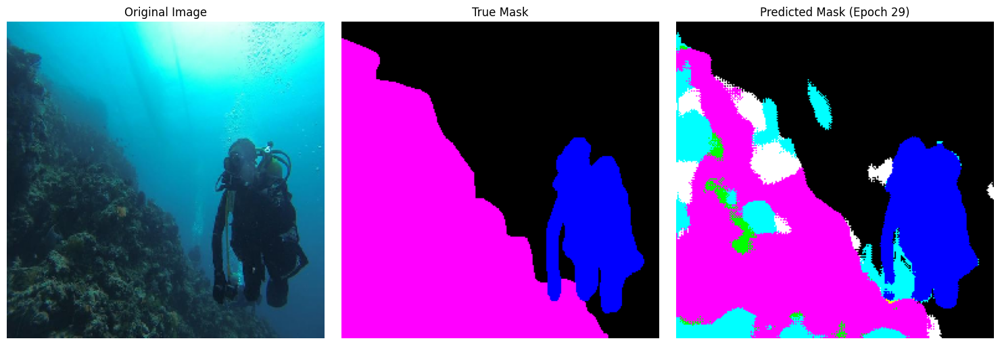

382/382 ━━━━━━━━━━━━━━━━━━━━ 142s 364ms/step - accuracy: 0.9396 - loss: 0.1807 - val_accuracy: 0.7135 - val_loss: 1.1530
Epoch 30/30
382/382 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9358 - loss: 0.1947
--- Generating prediction examples for epoch 30 ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


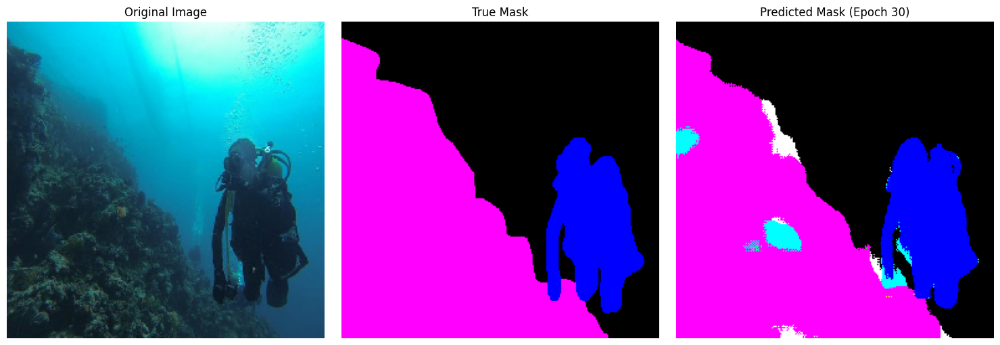

382/382 ━━━━━━━━━━━━━━━━━━━━ 172s 288ms/step - accuracy: 0.9358 - loss: 0.1947 - val_accuracy: 0.7521 - val_loss: 1.1852
Model training complete.


In [ ]:
print("\nStarting model training...")
# Check if datasets are available before training
if 'train_dataset' in locals() and 'test_dataset' in locals():
    history = model.fit(
        train_dataset,
        epochs=EPOCHS,
        validation_data=test_dataset, # ALERT: Should be updated (validation will use validation dataset, instead of test dataset)
        callbacks=[display_callback] # <-- ADD IT HERE (or [early_stopper, reduce_lr])

    )
    print("Model training complete.")

else:
    print("Training and/or test datasets not loaded. Skipping training.")

### 6.5. Plotting training history

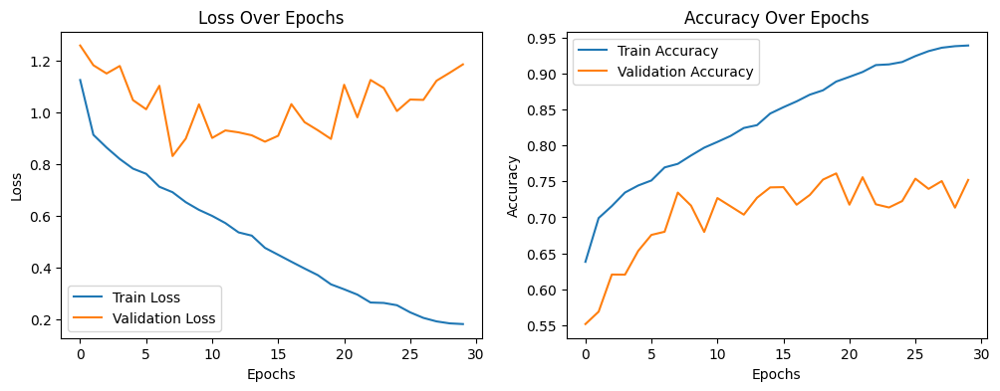

In [15]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

### 6.6. Evaluate the Model

In [16]:
print("\nEvaluating the model on the test set:")
if 'test_dataset' in locals() and 'model' in locals() and 'history' in locals(): # Check if model was trained
    results = model.evaluate(test_dataset)
    print(f"Test Loss: {results[0]:.4f}")
    print(f"Test Accuracy: {results[1]:.4f}")
else:
    print("Model or test dataset not available. Skipping evaluation.")


Evaluating the model on the test set:
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.7691 - loss: 1.0206
Test Loss: 1.1852
Test Accuracy: 0.7521


### 6.6. Make Predictions and Visualize


Displaying sample predictions...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


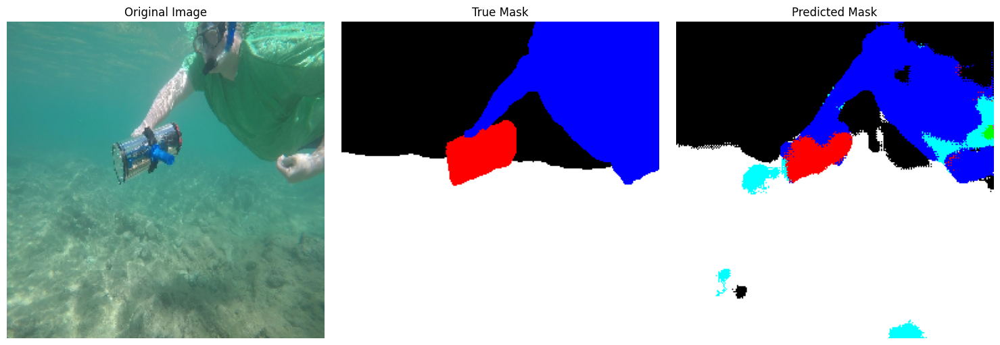

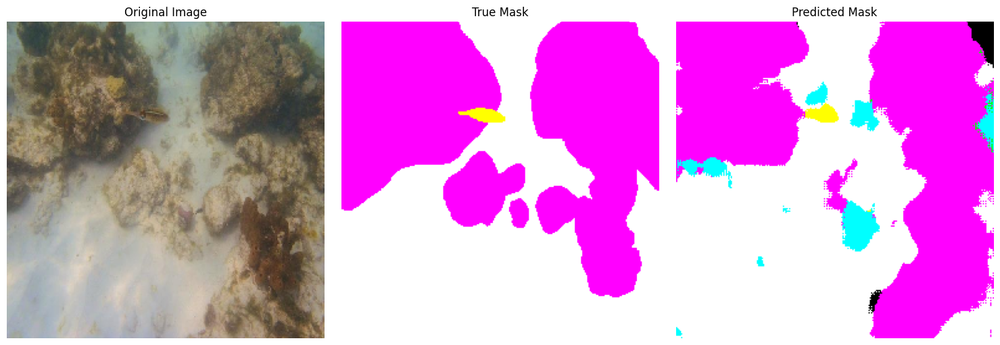

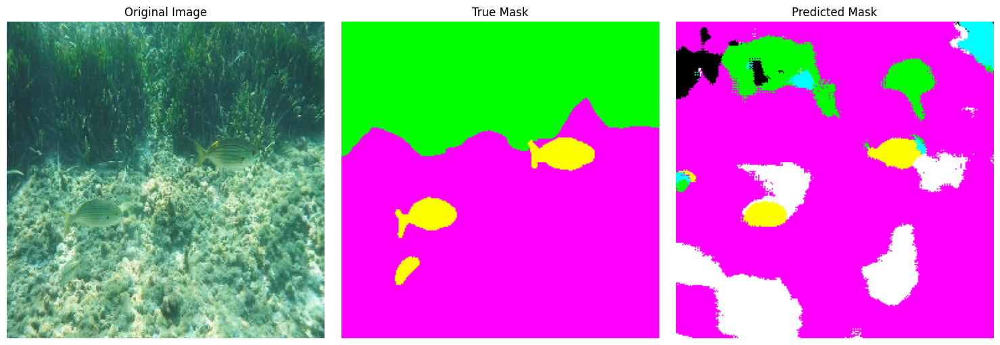

In [ ]:
def display_predictions(dataset, model, num_samples=3):
    """Displays original images, true masks, and predicted masks."""
    # Create a reverse map from integer label to RGB color for visualization
    int_to_rgb_map = {v: k for k, v in COLOR_MAP.items()}

    for images, true_masks_int in dataset.take(1): # Take one batch
        predicted_masks_probs = model.predict(images)
        predicted_masks_int = np.argmax(predicted_masks_probs, axis=-1) # Convert probabilities to class labels

        for i in range(min(num_samples, images.shape[0])):
            plt.figure(figsize=(15, 5))

            # Original Image
            plt.subplot(1, 3, 1)
            plt.imshow(images[i])
            plt.title("Original Image")
            plt.axis('off')

            # True Mask (converted to RGB for display)
            true_mask_rgb = np.zeros_like(images[i])
            for label_int, color_rgb in int_to_rgb_map.items():
                true_mask_rgb[true_masks_int[i, :, :, 0] == label_int] = np.array(color_rgb) / 255.0 # Normalize if colors are 0-255
            plt.subplot(1, 3, 2)
            plt.imshow(true_mask_rgb)
            plt.title("True Mask")
            plt.axis('off')

            # Predicted Mask (converted to RGB for display)
            pred_mask_rgb = np.zeros_like(images[i])
            for label_int, color_rgb in int_to_rgb_map.items():
                pred_mask_rgb[predicted_masks_int[i, :, :] == label_int] = np.array(color_rgb) / 255.0
            plt.subplot(1, 3, 3)
            plt.imshow(pred_mask_rgb)
            plt.title("Predicted Mask")
            plt.axis('off')

            plt.tight_layout()
            plt.show()

if 'test_dataset' in locals() and 'model' in locals() and 'history' in locals():
  print("\nDisplaying sample predictions...")
  display_predictions(test_dataset, model, num_samples=3)